In [1]:
import numpy as np       # linear algebra
import pandas as pd      # data processing 
import seaborn as sns

import os

import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing the dataset
activity = pd.read_csv('FitBit data.csv')

In [3]:
import pandas_profiling

In [4]:
# seeing the full report about the dataset
activity.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# checking the number of rows and columns in dataset
activity.shape

(457, 15)

In [6]:
# checking the number of missing values in dataset
activity.isna().sum()

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [7]:
# seeing a sample of 10 rows of the dataset
activity.sample(10)

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
374,7007744171,4/9/2016,10345,6.92,6.92,0.0,0.07,0.27,6.58,0.00,2,6,358,1074,2613
75,2022484408,4/4/2016,15313,11.00,11.00,0.0,5.02,1.29,4.69,0.00,62,19,233,1126,2581
146,3372868164,4/4/2016,5861,4.02,4.02,0.0,1.30,0.22,2.49,0.01,20,7,233,1180,1878
280,4702921684,4/2/2016,10328,8.38,8.38,0.0,0.00,1.46,6.92,0.00,0,32,367,475,3323
265,4558609924,4/2/2016,3183,2.10,2.10,0.0,0.00,0.00,2.10,0.00,0,0,173,1180,1680
131,2873212765,4/9/2016,14103,9.56,9.56,0.0,3.02,0.41,6.14,0.01,46,8,288,1098,2257
148,3372868164,4/6/2016,6406,4.39,4.39,0.0,0.78,0.09,3.52,0.01,17,4,325,1094,2010
380,7086361926,4/3/2016,1949,1.31,1.31,0.0,0.23,0.35,0.73,0.00,3,6,27,1404,1794
433,8792009665,4/1/2016,4592,2.94,2.94,0.0,0.10,0.14,2.70,0.00,4,8,176,748,2260
77,2022484408,4/6/2016,15392,10.93,10.93,0.0,3.43,1.75,5.75,0.00,47,42,258,1093,2733


In [8]:
# copying dataset to activity1
activity1 = activity.copy()

In [9]:
# checking out the unique
activity1['ActivityDate'].unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [10]:
# checking out the dataset before transformation
activity1['ActivityDate'].head(10)

0    3/25/2016
1    3/26/2016
2    3/27/2016
3    3/28/2016
4    3/29/2016
5    3/30/2016
6    3/31/2016
7     4/1/2016
8     4/2/2016
9     4/3/2016
Name: ActivityDate, dtype: object

In [11]:
# adding the year, month and date column to the dataset
activity1['year'] = pd.DatetimeIndex(activity1['ActivityDate']).year   
activity1['month'] = pd.DatetimeIndex(activity1['ActivityDate']).month          
activity1['date'] = pd.DatetimeIndex(activity1['ActivityDate']).day          

In [12]:
# checking out the dataset after transformation
activity1.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29
5,1503960366,3/30/2016,10970,7.16,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820,2016,3,30
6,1503960366,3/31/2016,12256,7.86,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889,2016,3,31
7,1503960366,4/1/2016,12262,7.87,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868,2016,4,1
8,1503960366,4/2/2016,11248,7.25,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843,2016,4,2
9,1503960366,4/3/2016,10016,6.37,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850,2016,4,3


In [13]:
# dropping the TrackerDistance
activity1 = activity1.drop(['TrackerDistance'], axis=1)

In [14]:
# checking out the first 100 rows of the dataset
activity1.head(100)

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date
0,1503960366,3/25/2016,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25
1,1503960366,3/26/2016,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26
2,1503960366,3/27/2016,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27
3,1503960366,3/28/2016,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28
4,1503960366,3/29/2016,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2026352035,4/12/2016,1019,0.63,0.0,0.00,0.00,0.63,0.0,0,0,64,223,600,2016,4,12
96,2320127002,4/1/2016,0,0.00,0.0,0.00,0.00,0.00,0.0,0,0,0,1440,1324,2016,4,1
97,2320127002,4/2/2016,0,0.00,0.0,0.00,0.00,0.00,0.0,0,0,0,1440,1324,2016,4,2
98,2320127002,4/3/2016,0,0.00,0.0,0.00,0.00,0.00,0.0,0,0,0,1440,1324,2016,4,3


Text(0.5, 1.0, 'Box plot of Calories with Jitter by day of the month')

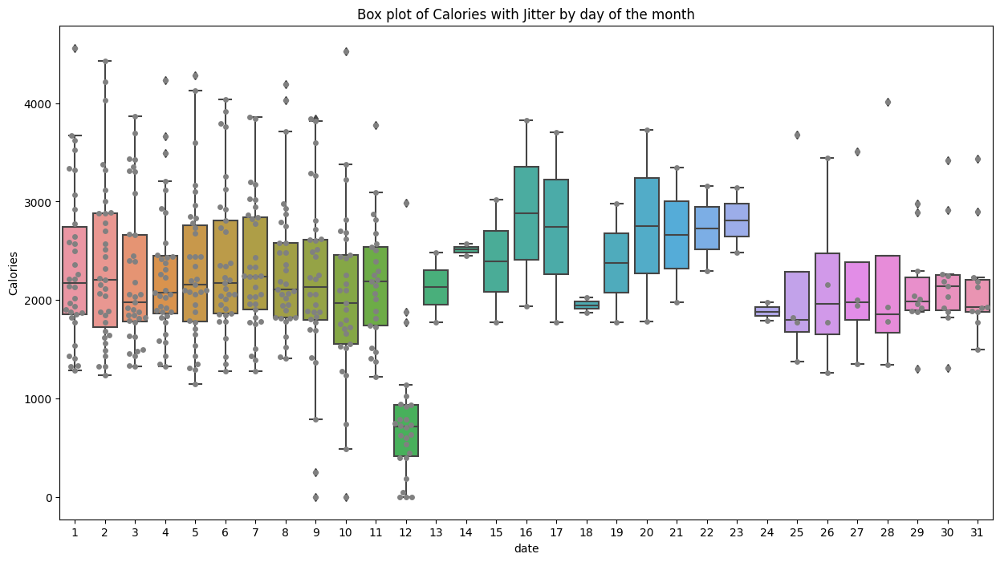

In [17]:
# Gropby the day of the month and make a boxplot of calories urn
import matplotlib.pyplot as plt
%matplotlib inline
# figure size
plt.figure(figsize=(15,8))

# usual boxplot
ax = sns.boxplot(x='date', y='Calories', data= activity1)                

# add jitter with the swarmplot function
ax = sns.swarmplot(x='date', y='Calories', data=activity1, color='gray')  

ax.set_title('Box plot of Calories with Jitter by day of the month')


In [18]:
# converting the datatype to datatime
activity1['Week'] = pd.to_datetime(activity1.ActivityDate).dt.week              
activity1['Year'] = pd.to_datetime(activity1.ActivityDate).dt.year

In [19]:
# checking out the dataset after transformation 
activity1.head()

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,Week,Year
0,1503960366,3/25/2016,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,12,2016
1,1503960366,3/26/2016,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,12,2016
2,1503960366,3/27/2016,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,12,2016
3,1503960366,3/28/2016,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,13,2016
4,1503960366,3/29/2016,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,13,2016


In [20]:
# checking the datatype of ActivityDate column
activity1.ActivityDate.dtype

dtype('O')

In [21]:
# converting to datetime
activity1['ActivityDate'] = pd.to_datetime(activity1['ActivityDate'])                     

In [24]:
# converting the day of the week to the name of the day
activity1['day'] = activity1['ActivityDate'].dt.day_name()

In [25]:
# checking out the dataset after transformation
activity1.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,Week,Year,day
0,1503960366,2016-03-25,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,12,2016,Friday
1,1503960366,2016-03-26,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,12,2016,Saturday
2,1503960366,2016-03-27,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,12,2016,Sunday
3,1503960366,2016-03-28,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,13,2016,Monday
4,1503960366,2016-03-29,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,13,2016,Tuesday
5,1503960366,2016-03-30,10970,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820,2016,3,30,13,2016,Wednesday
6,1503960366,2016-03-31,12256,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889,2016,3,31,13,2016,Thursday
7,1503960366,2016-04-01,12262,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868,2016,4,1,13,2016,Friday
8,1503960366,2016-04-02,11248,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843,2016,4,2,13,2016,Saturday
9,1503960366,2016-04-03,10016,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850,2016,4,3,13,2016,Sunday


Text(0.5, 1.0, 'Barplot of calories by th day of the week')

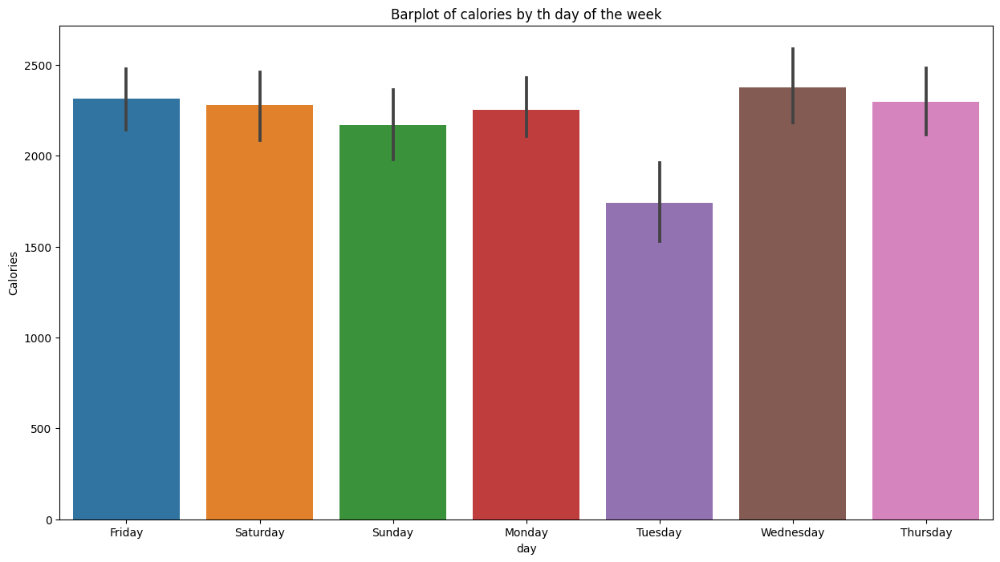

In [26]:
# figure size
plt.figure(figsize=(15,8))

# simple barplot
ax = sns.barplot(x='day', y='Calories', data= activity1)

ax.set_title("Barplot of calories by th day of the week")

Text(0.5, 1.0, 'Scatterplot of calories and intense_activityes')

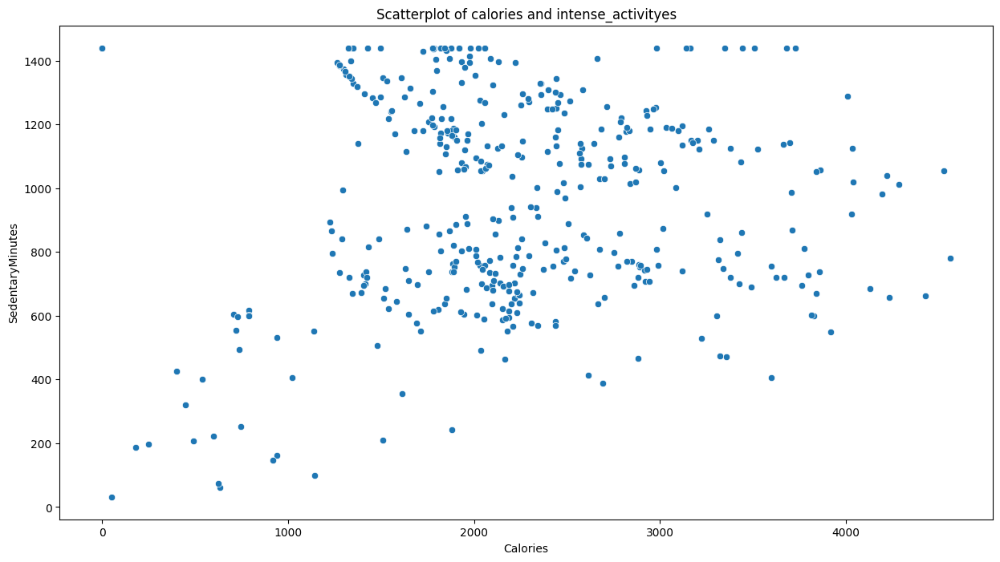

In [27]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot
ax = sns.scatterplot(x= 'Calories', y= 'SedentaryMinutes', data= activity1)

ax.set_title('Scatterplot of calories and intense_activityes')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

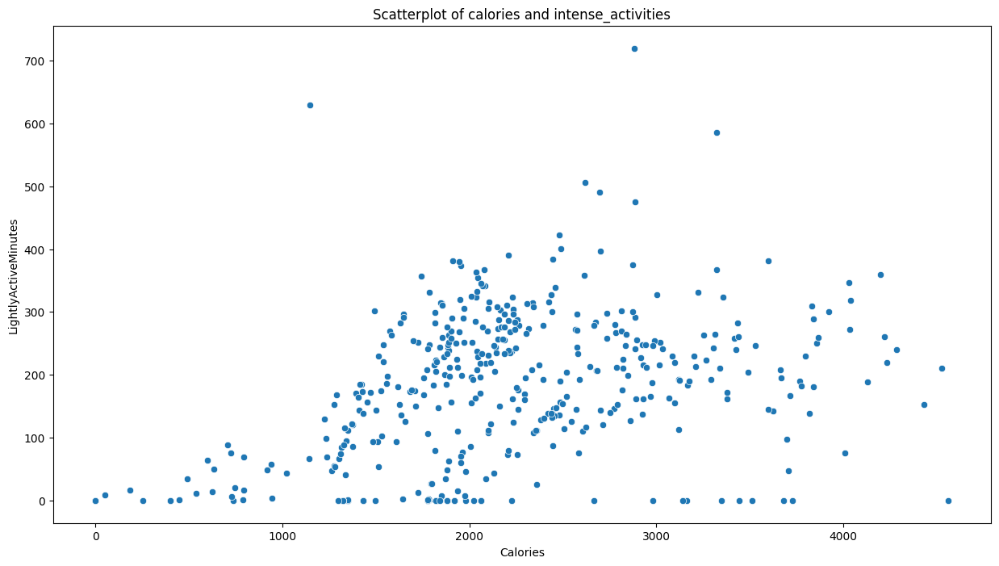

In [28]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot
ax = sns.scatterplot(x= 'Calories', y= 'LightlyActiveMinutes', data= activity1)

ax.set_title('Scatterplot of calories and intense_activities')

Text(0.5, 1.0, 'Scatterplot of calories vs Fairly Active Minutes')

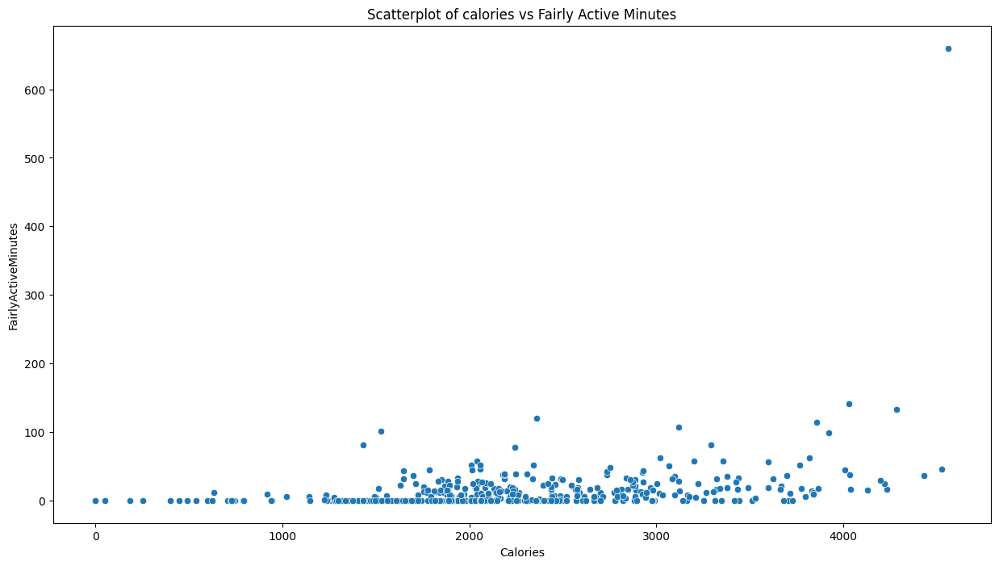

In [29]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt in the moderatly active minutes
ax = sns.scatterplot(x= 'Calories', y= 'FairlyActiveMinutes', data= activity1)

ax.set_title('Scatterplot of calories vs Fairly Active Minutes')

Text(0.5, 1.0, 'Scatterplot of calories and intense_activities')

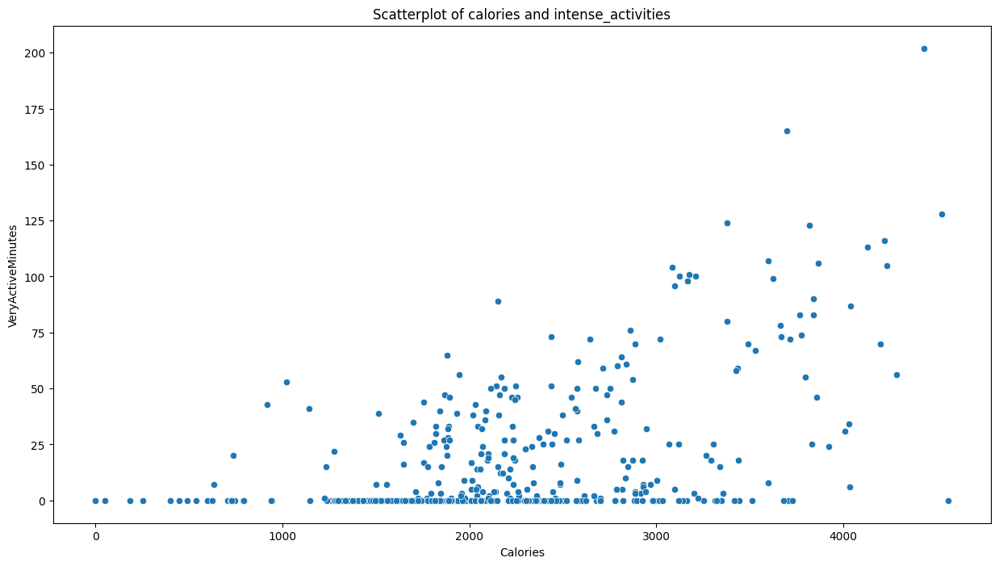

In [30]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt in the intensely active minutes
ax = sns.scatterplot(x= 'Calories', y= 'VeryActiveMinutes', data= activity1)

ax.set_title('Scatterplot of calories and intense_activities')

In [31]:
# checking out the dataset before transformation
activity1.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,Week,Year,day
0,1503960366,2016-03-25,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,12,2016,Friday
1,1503960366,2016-03-26,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,12,2016,Saturday
2,1503960366,2016-03-27,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,12,2016,Sunday
3,1503960366,2016-03-28,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,13,2016,Monday
4,1503960366,2016-03-29,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,13,2016,Tuesday
5,1503960366,2016-03-30,10970,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820,2016,3,30,13,2016,Wednesday
6,1503960366,2016-03-31,12256,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889,2016,3,31,13,2016,Thursday
7,1503960366,2016-04-01,12262,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868,2016,4,1,13,2016,Friday
8,1503960366,2016-04-02,11248,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843,2016,4,2,13,2016,Saturday
9,1503960366,2016-04-03,10016,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850,2016,4,3,13,2016,Sunday


In [32]:
# dropping the columns week and year
activity1 = activity1.drop(['Week', 'Year'], axis=1)

In [33]:
# checking out the dataset after transformation
activity1.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,year,month,date,day
0,1503960366,2016-03-25,11004,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,Friday
1,1503960366,2016-03-26,17609,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,Saturday
2,1503960366,2016-03-27,12736,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,Sunday
3,1503960366,2016-03-28,13231,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,Monday
4,1503960366,2016-03-29,12041,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,Tuesday
5,1503960366,2016-03-30,10970,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820,2016,3,30,Wednesday
6,1503960366,2016-03-31,12256,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889,2016,3,31,Thursday
7,1503960366,2016-04-01,12262,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868,2016,4,1,Friday
8,1503960366,2016-04-02,11248,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843,2016,4,2,Saturday
9,1503960366,2016-04-03,10016,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850,2016,4,3,Sunday


In [34]:
# checking the number of rows and columns in the transformed dataset
activity1.shape

(457, 18)

Text(0.5, 1.0, 'Un-normalized value of calories and different activities based on activity minutes')

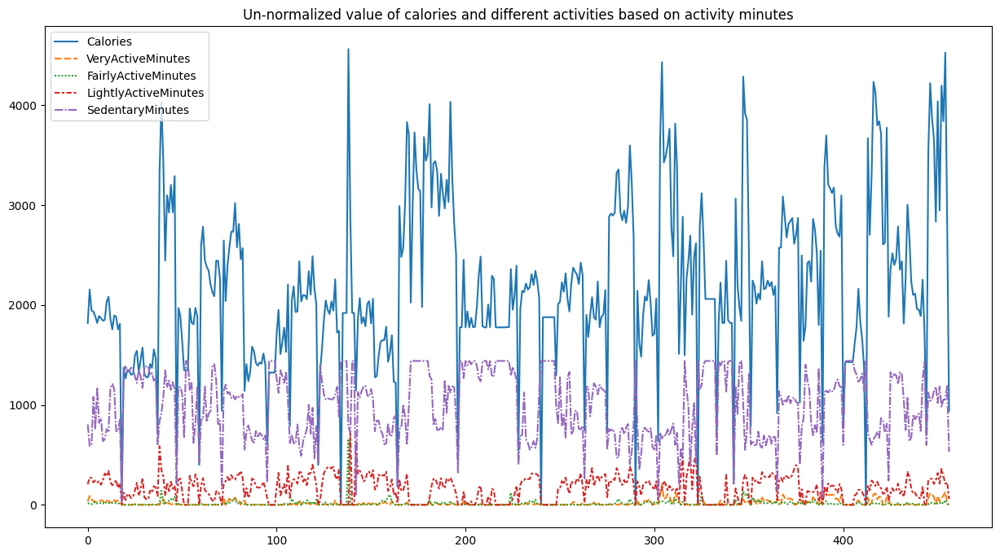

In [35]:
# plot the raw values

col_select = ['Calories', 'VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes', 'SedentaryMinutes']
wide_df = activity1[col_select]

# figure size
plt.figure(figsize=(15,8))

# timeseries plot using lineplot
ax = sns.lineplot(data=wide_df)

ax.set_title('Un-normalized value of calories and different activities based on activity minutes')

Text(0.5, 1.0, 'Scatterplot of calories and Total Distance')

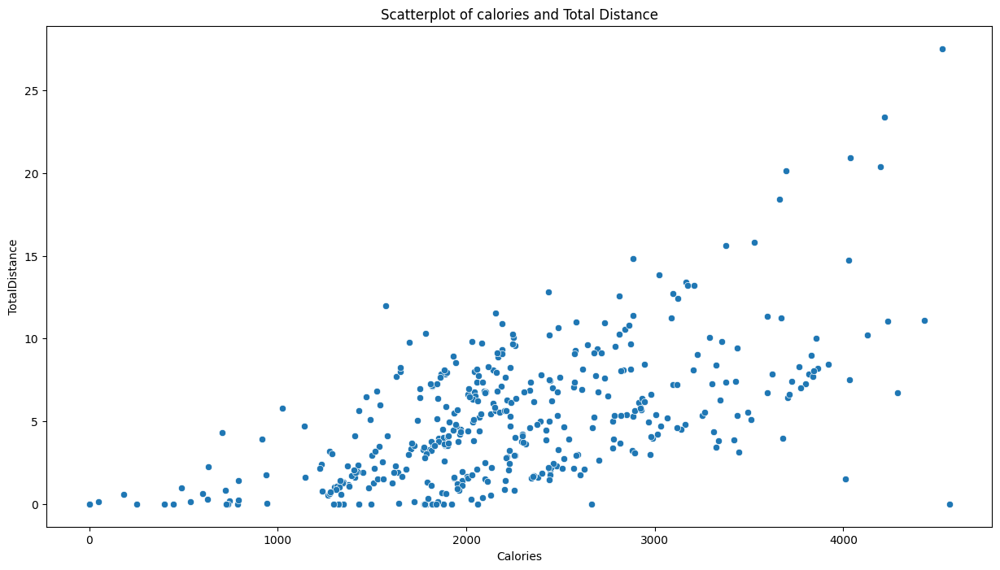

In [36]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt and total distance covered
ax = sns.scatterplot(x= 'Calories', y= 'TotalDistance', data= activity1)

ax.set_title('Scatterplot of calories and Total Distance')

Text(0.5, 1.0, 'Scatterplot of calories and Logged Activities Distance')

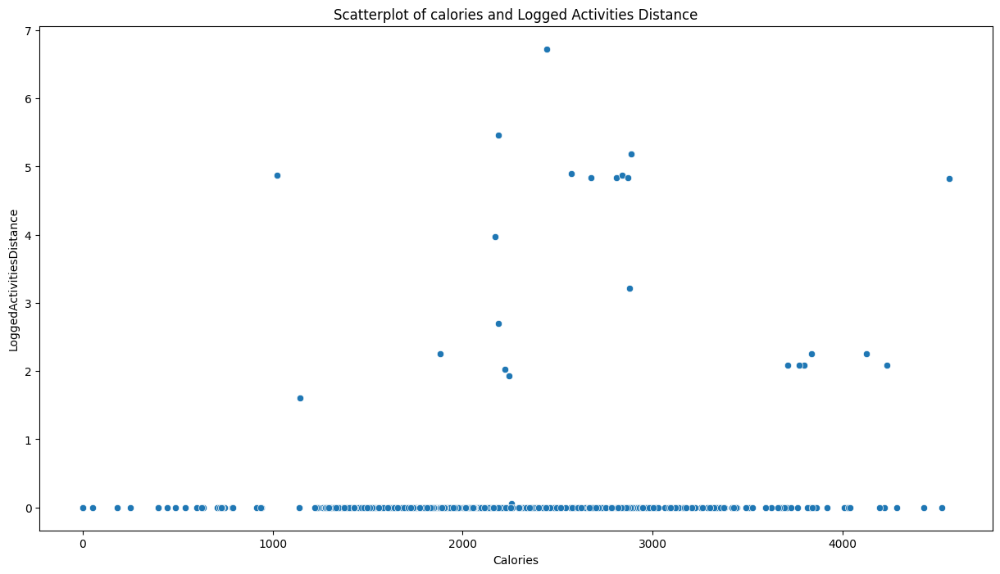

In [37]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt and total distance covered
ax = sns.scatterplot(x= 'Calories', y= 'LoggedActivitiesDistance', data= activity1)

ax.set_title('Scatterplot of calories and Logged Activities Distance')

Text(0.5, 1.0, 'Scatterplot of calories and Very Active Distance')

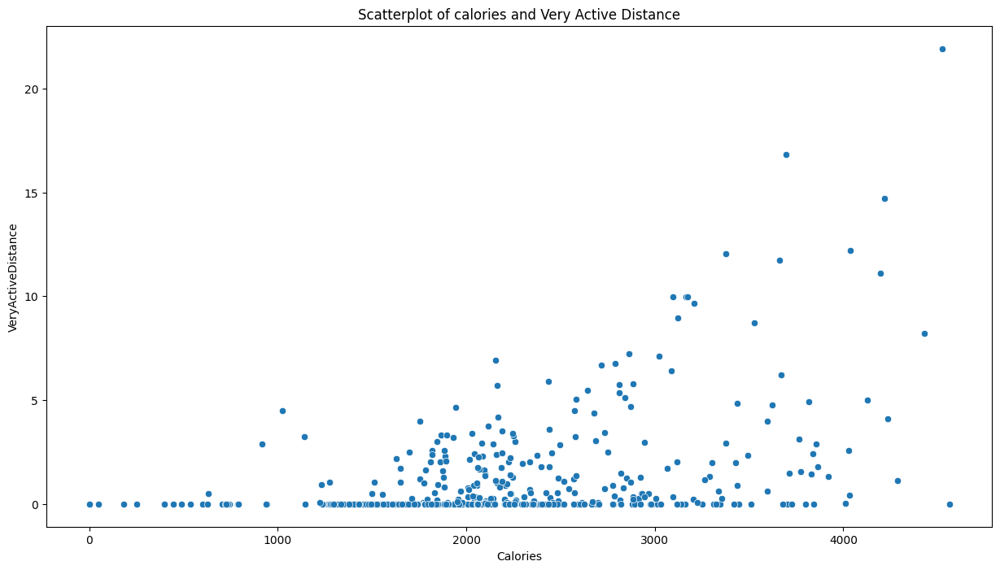

In [38]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt and total distance covered
ax = sns.scatterplot(x= 'Calories', y= 'VeryActiveDistance', data= activity1)

ax.set_title('Scatterplot of calories and Very Active Distance')

Text(0.5, 1.0, 'Scatterplot of calories and Moderatly Active Distance')

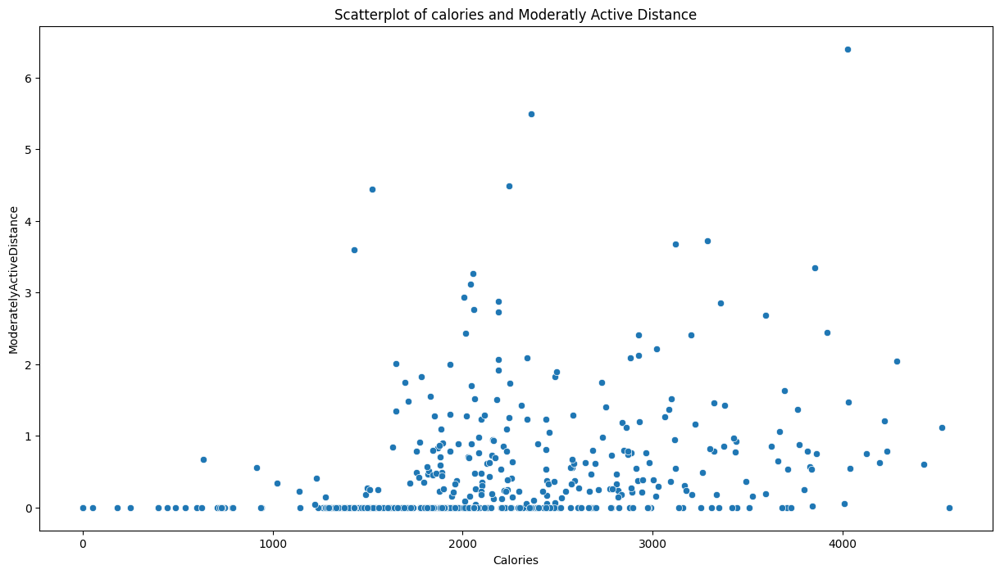

In [39]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt and total distance covered
ax = sns.scatterplot(x= 'Calories', y= 'ModeratelyActiveDistance', data= activity1)

ax.set_title('Scatterplot of calories and Moderatly Active Distance')

Text(0.5, 1.0, 'Scatterplot of calories and Light Active Distance')

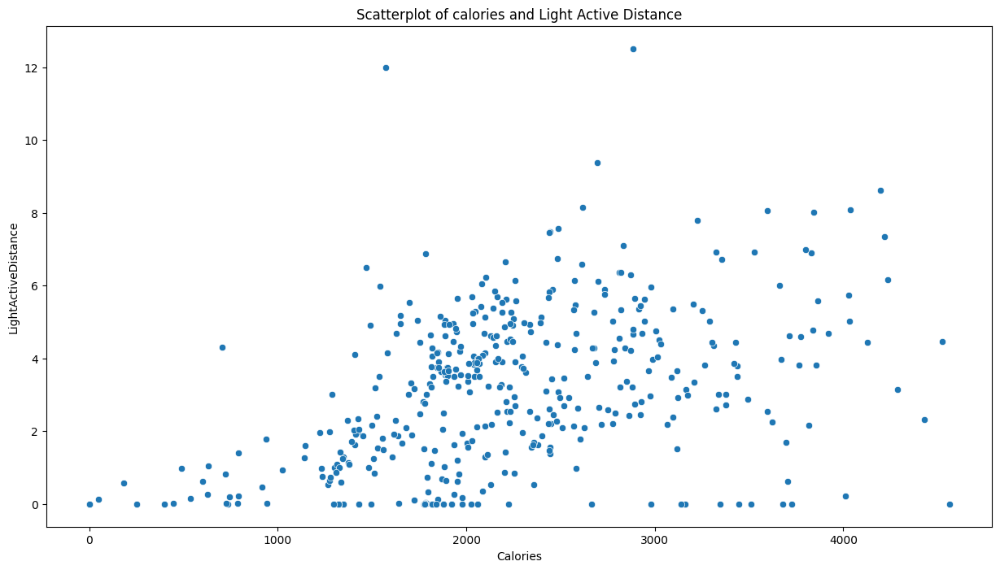

In [40]:
# figure size
plt.figure(figsize=(15,8))

# simple scatterplot between calories burnt and total distance covered
ax = sns.scatterplot(x= 'Calories', y= 'LightActiveDistance', data= activity1)

ax.set_title('Scatterplot of calories and Light Active Distance')

Text(0.5, 1.0, 'Un-normalized value of calories and different activities based on distance')

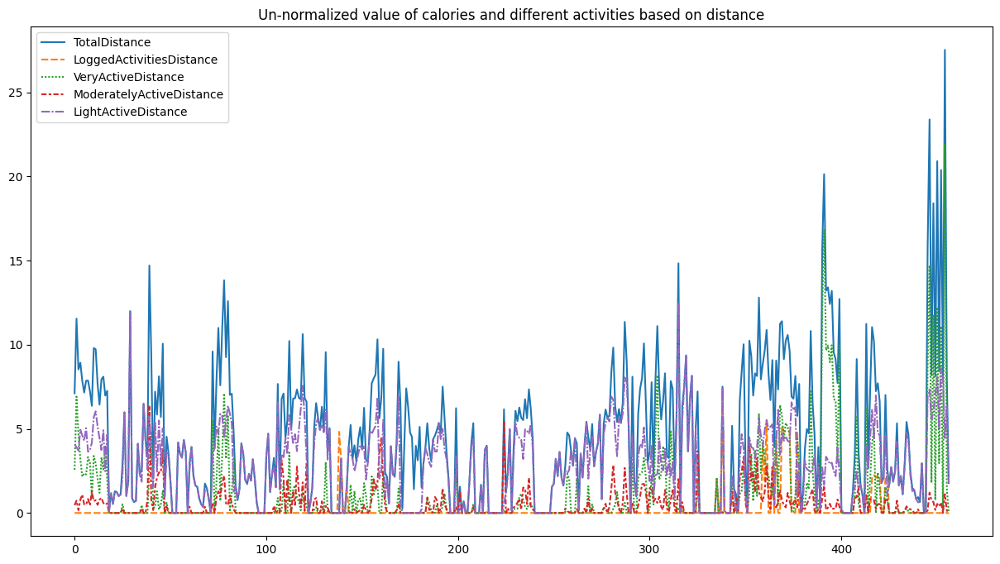

In [41]:
# plot the new values

rol_select = ['TotalDistance', 'LoggedActivitiesDistance', 'VeryActiveDistance', 'ModeratelyActiveDistance', 'LightActiveDistance'] 
wide_df1 = activity1[rol_select]

# figure size
plt.figure(figsize=(15,8))

# timeseries plot using lineplot
ax = sns.lineplot(data=wide_df1)

ax.set_title('Un-normalized value of calories and different activities based on distance')

### The  EDA here gives us the insight about the relation between the active hours, the distance for which the user has moderate and intense activity and the calories burnt during that period. 